<a href="https://colab.research.google.com/github/Aaarin12/Pheno12/blob/main/Lingonberry_Gel_detection_Genomics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Sat Feb 22 13:20:00 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   61C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.5/921.5 kB 50.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 107.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 72.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.2/235.7 GB disk)


In [4]:
from ultralytics import YOLO
from IPython.display import display, Image

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="EwfHIT9w5sdIPsyyFO5v")
project = rf.workspace("image-analysis-0mduj").project("gel-annotation-on-lingonberry")
version = project.version(1)
dataset = version.download("yolov12")


loading Roboflow workspace...
loading Roboflow project...


In [7]:
dataset.location

'/content/Gel-annotation-on-lingonberry-1'

In [8]:
! yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo12s.pt" epochs=60 imgsz=800

100% 18.1M/18.1M [00:00<00:00, 65.0MB/s]
Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo12s.pt, data=/content/Gel-annotation-on-lingonberry-1/data.yaml, epochs=60, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fal

In [9]:
from IPython.display import display, Image

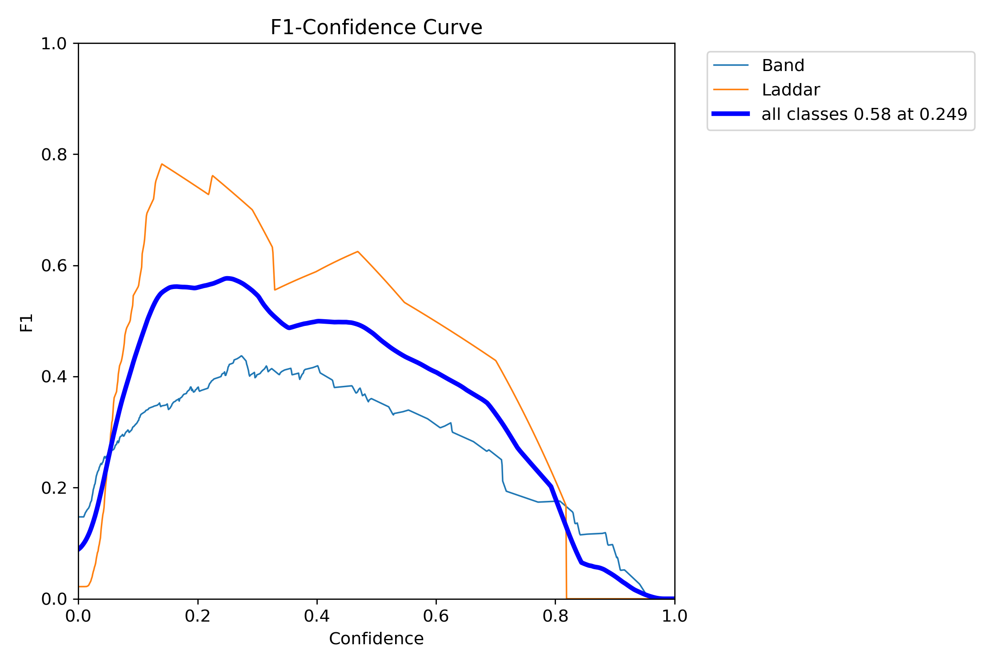

In [11]:
Image ("/content/runs/detect/train/F1_curve.png", width= 600)

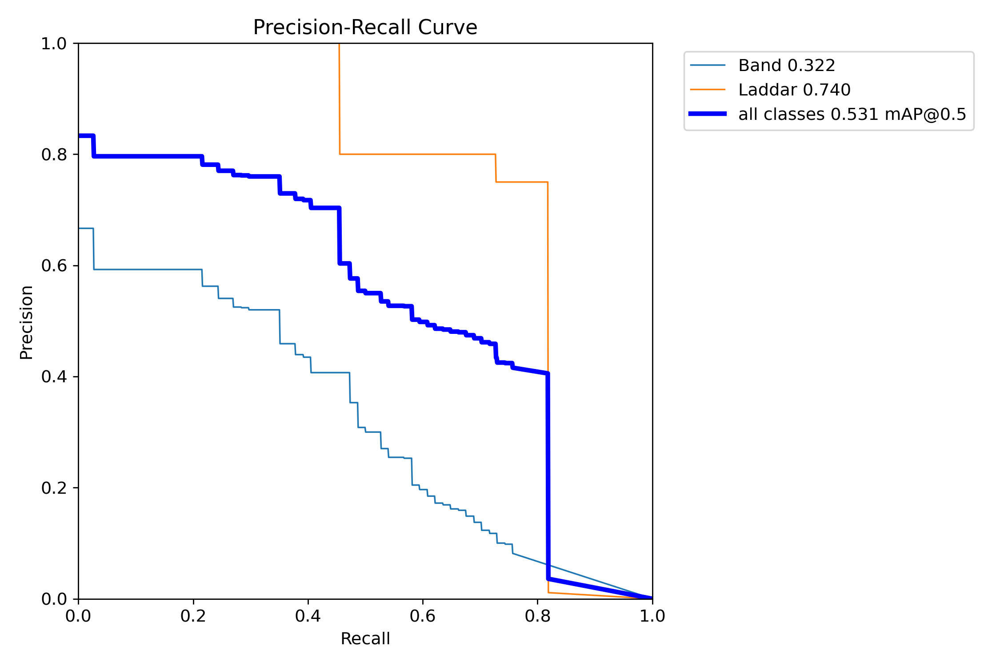

In [12]:
Image ("/content/runs/detect/train/PR_curve.png", width= 600)

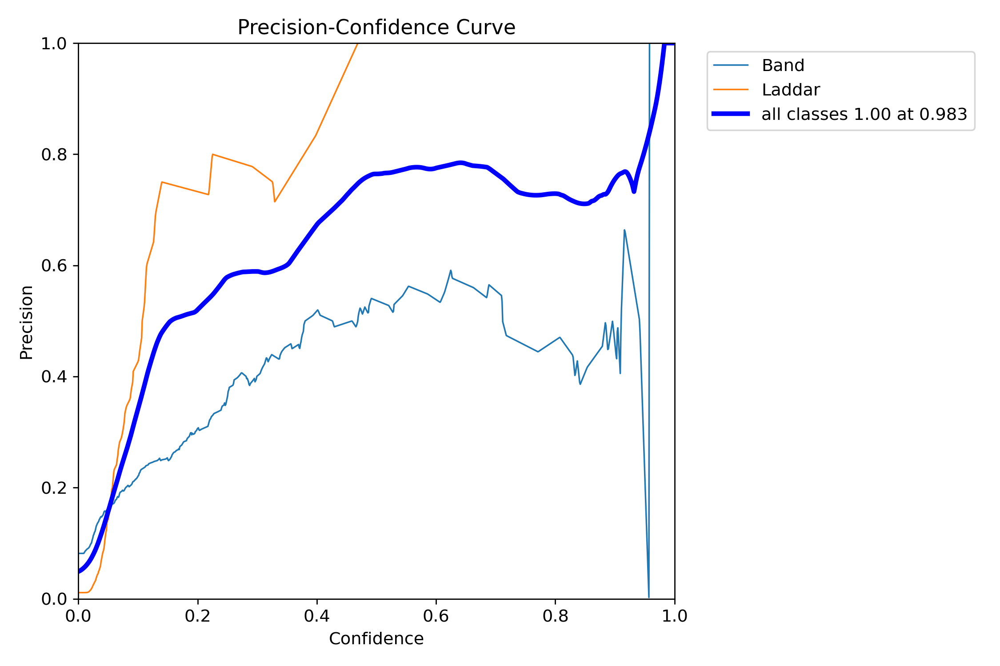

In [13]:
Image ("/content/runs/detect/train/P_curve.png", width= 600)

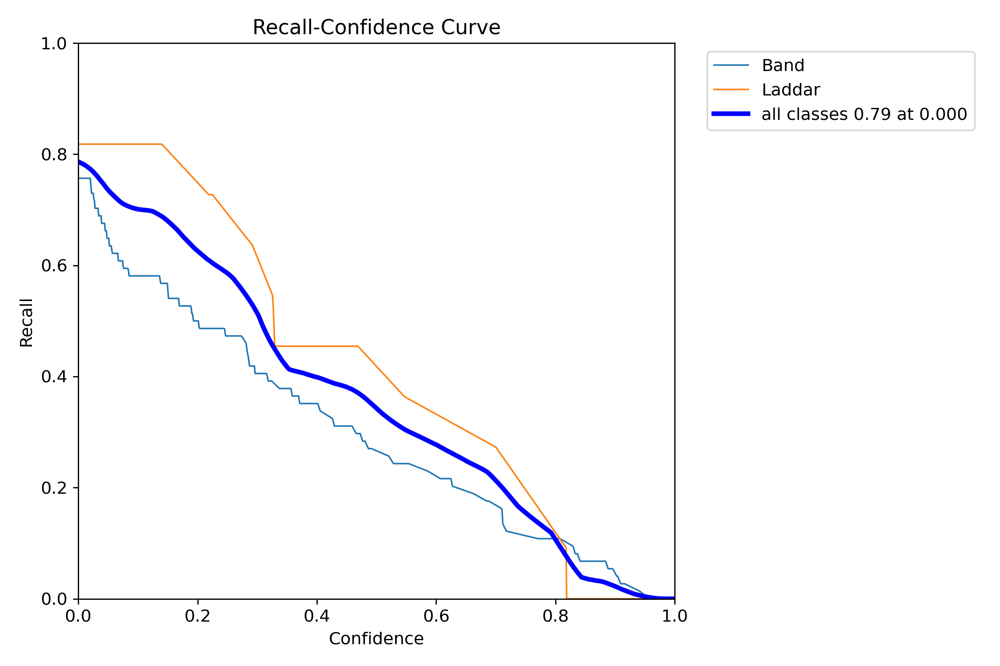

In [14]:
Image ("/content/runs/detect/train/R_curve.png", width= 600)

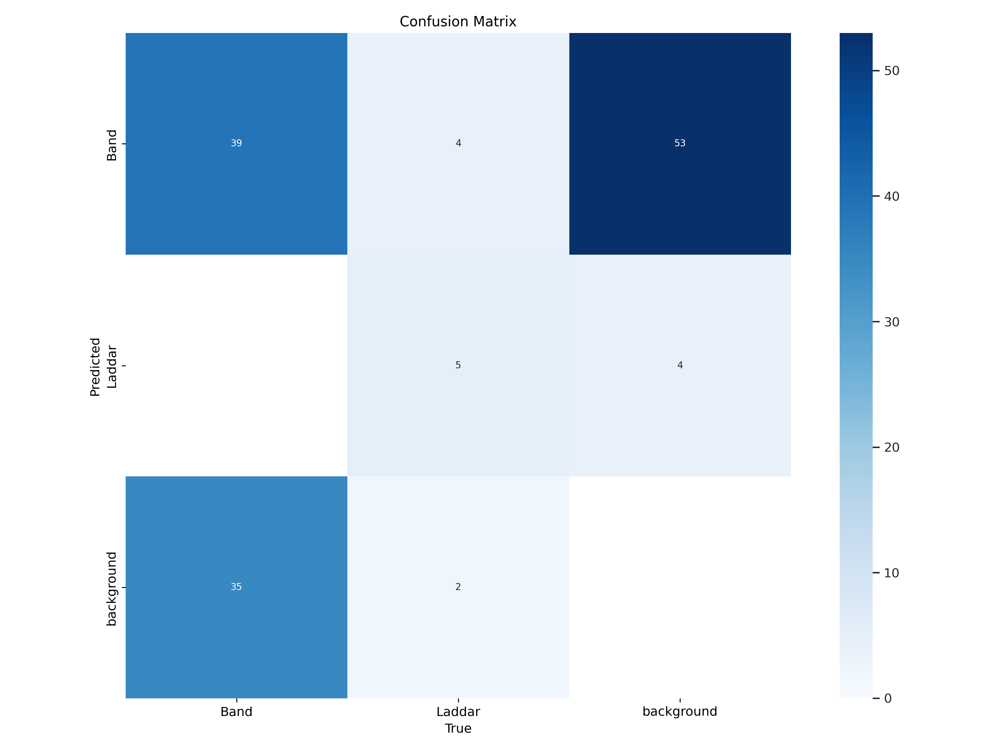

In [16]:
Image ("/content/runs/detect/train/confusion_matrix.png", width= 900)

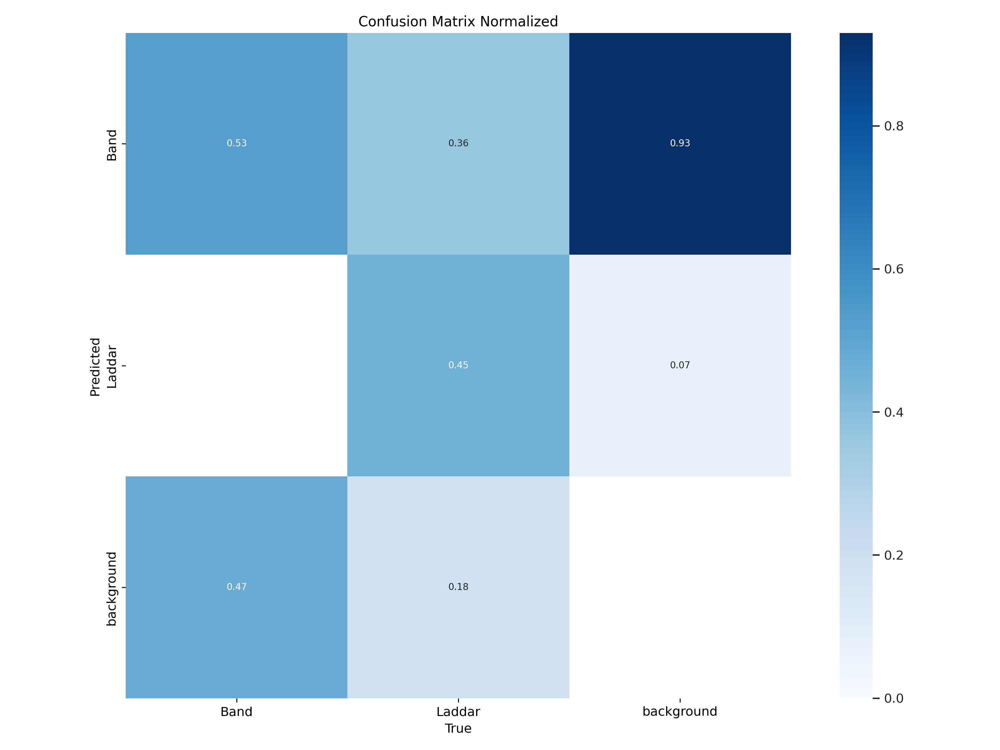

In [17]:
Image ("/content/runs/detect/train/confusion_matrix_normalized.png", width= 900)

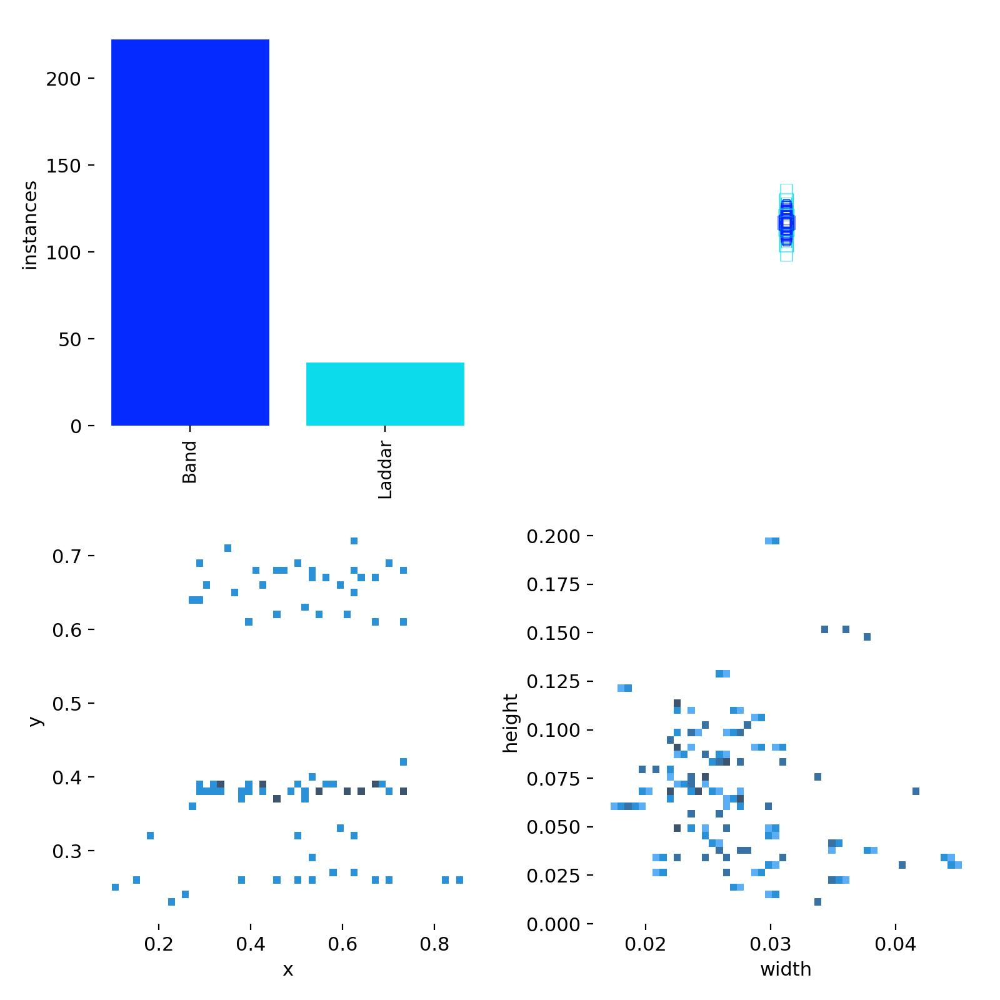

In [18]:
Image ("/content/runs/detect/train/labels.jpg", width= 900)

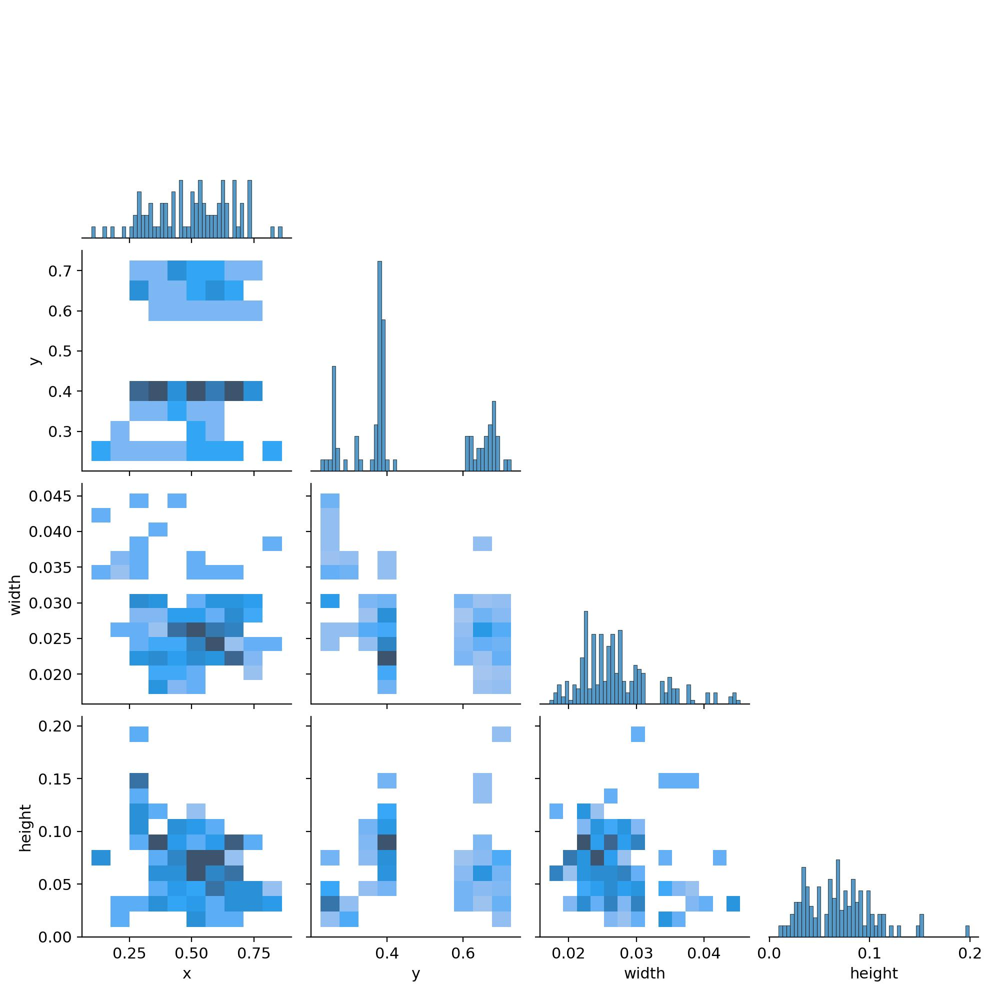

In [19]:
Image ("/content/runs/detect/train/labels_correlogram.jpg", width= 900)

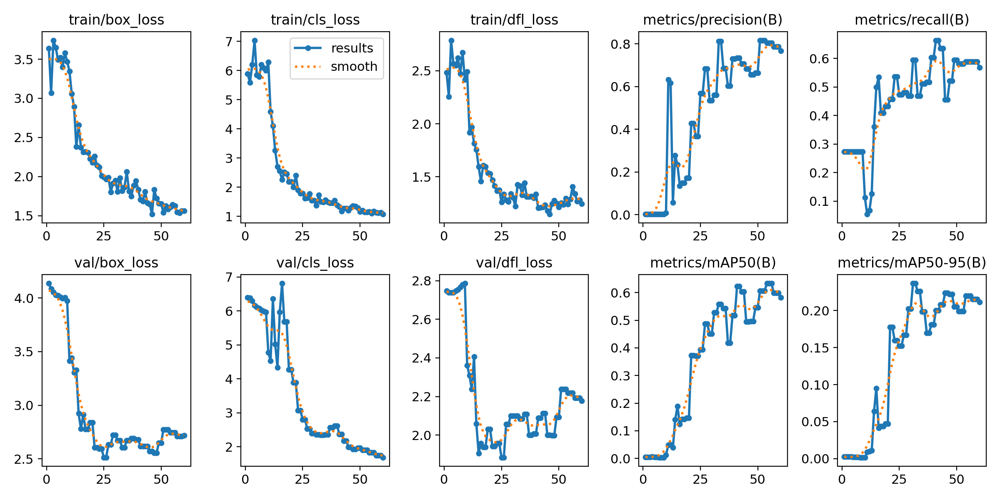

In [20]:
Image ("/content/runs/detect/train/results.png", width= 900)

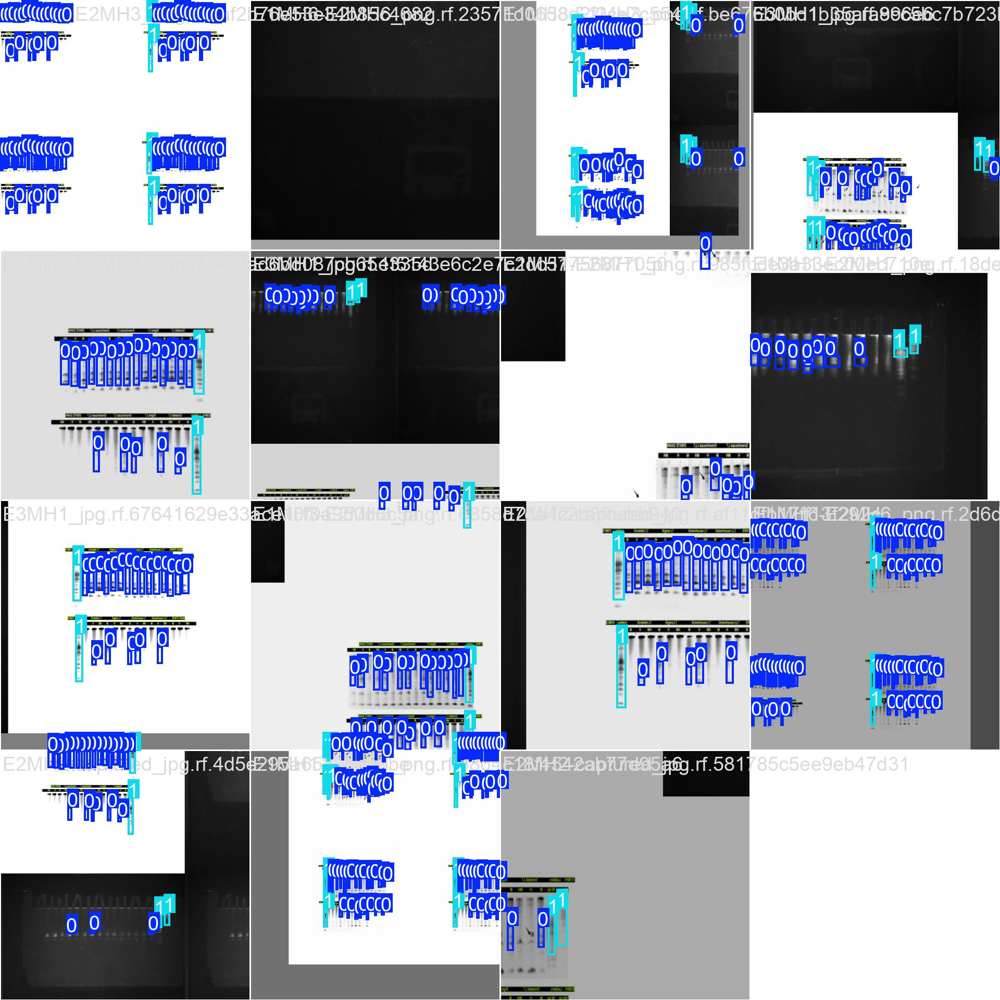

In [21]:
Image ("/content/runs/detect/train/train_batch0.jpg", width= 900)

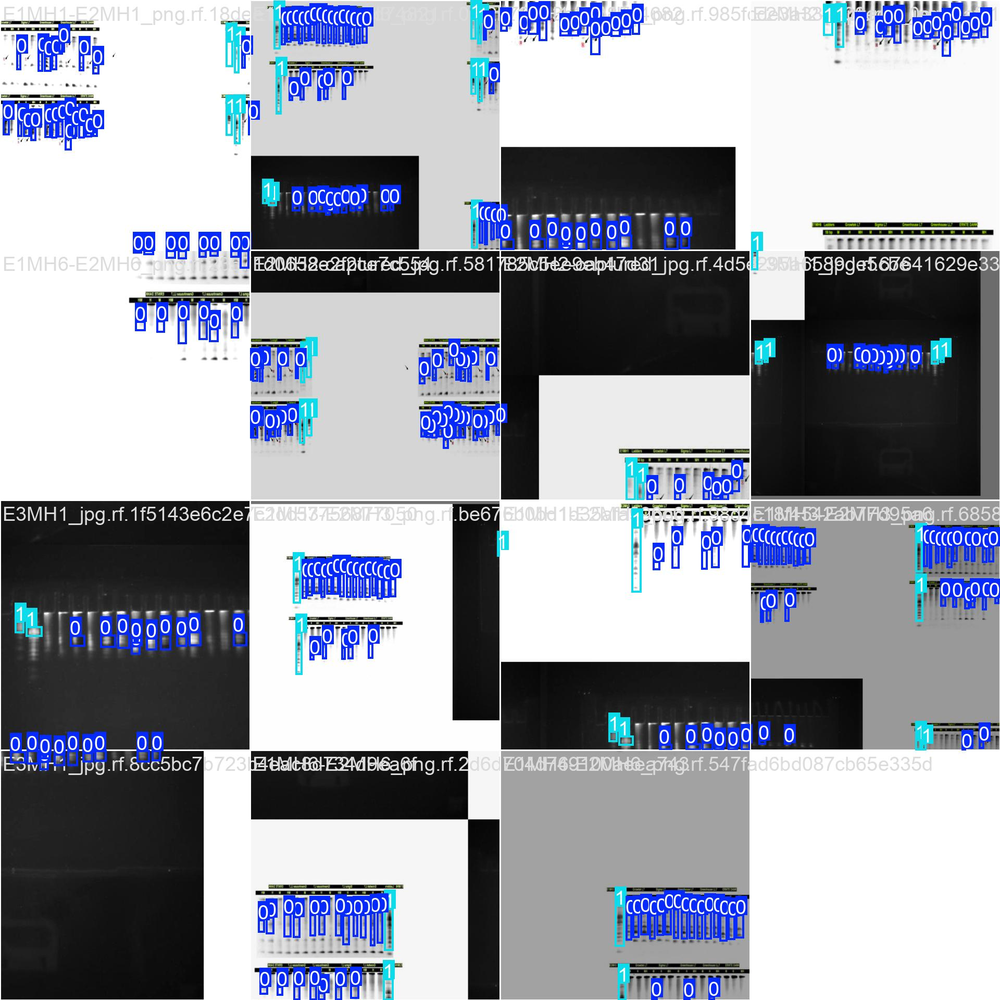

In [22]:
Image ("/content/runs/detect/train/train_batch1.jpg", width= 900)

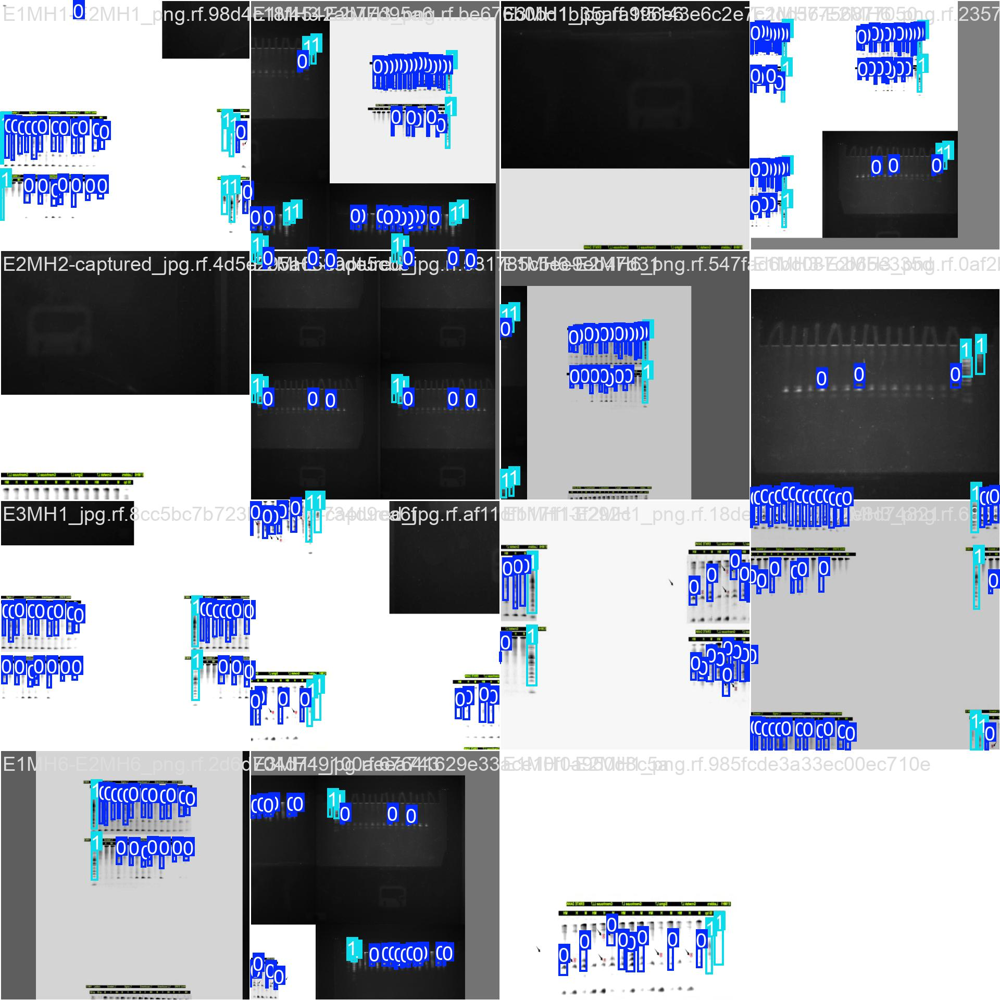

In [23]:
Image ("/content/runs/detect/train/train_batch2.jpg", width= 900)

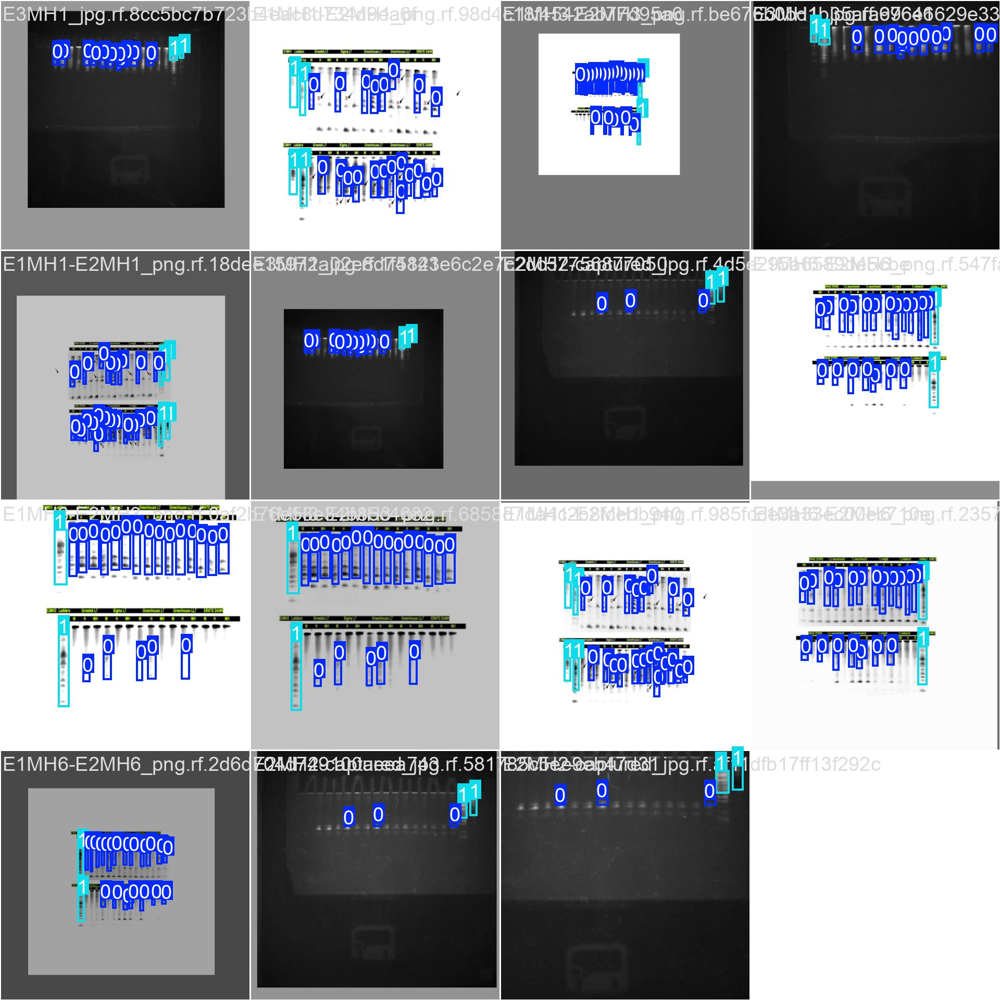

In [24]:
Image ("/content/runs/detect/train/train_batch50.jpg", width= 900)

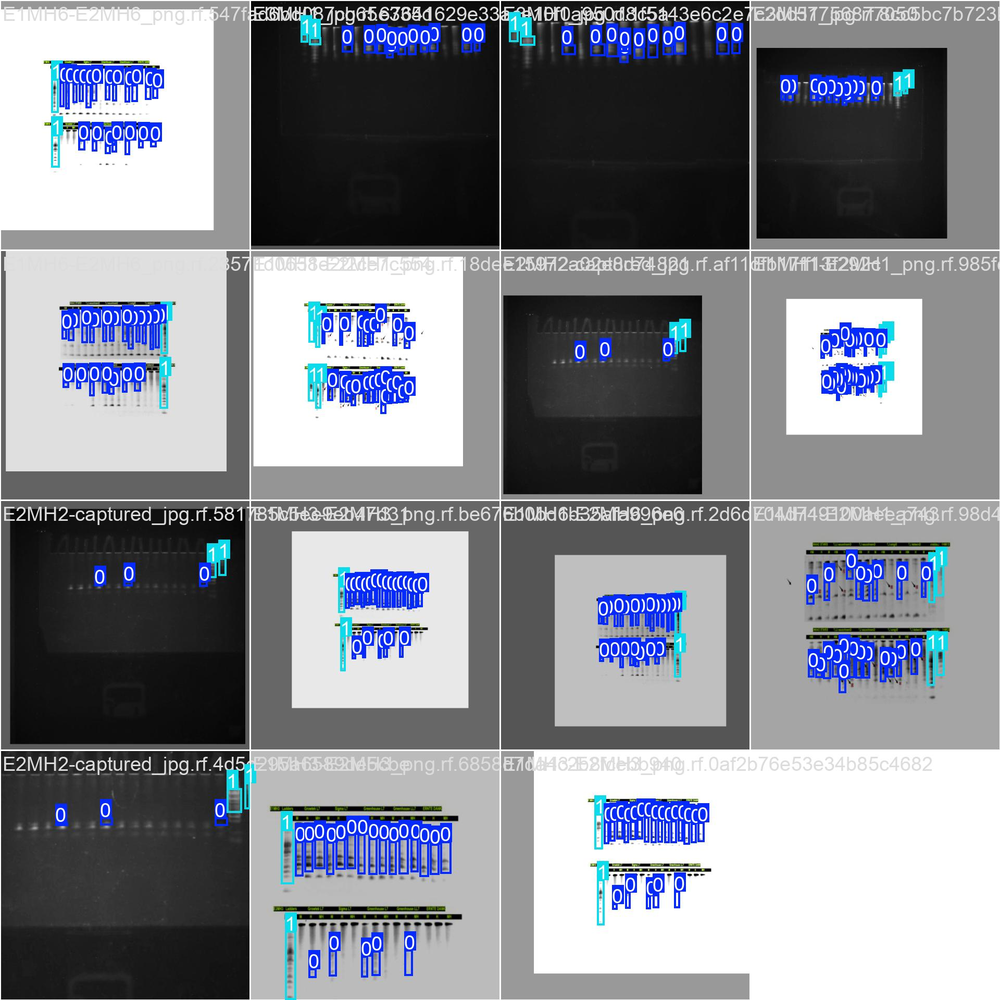

In [25]:
Image ("/content/runs/detect/train/train_batch51.jpg", width= 900)

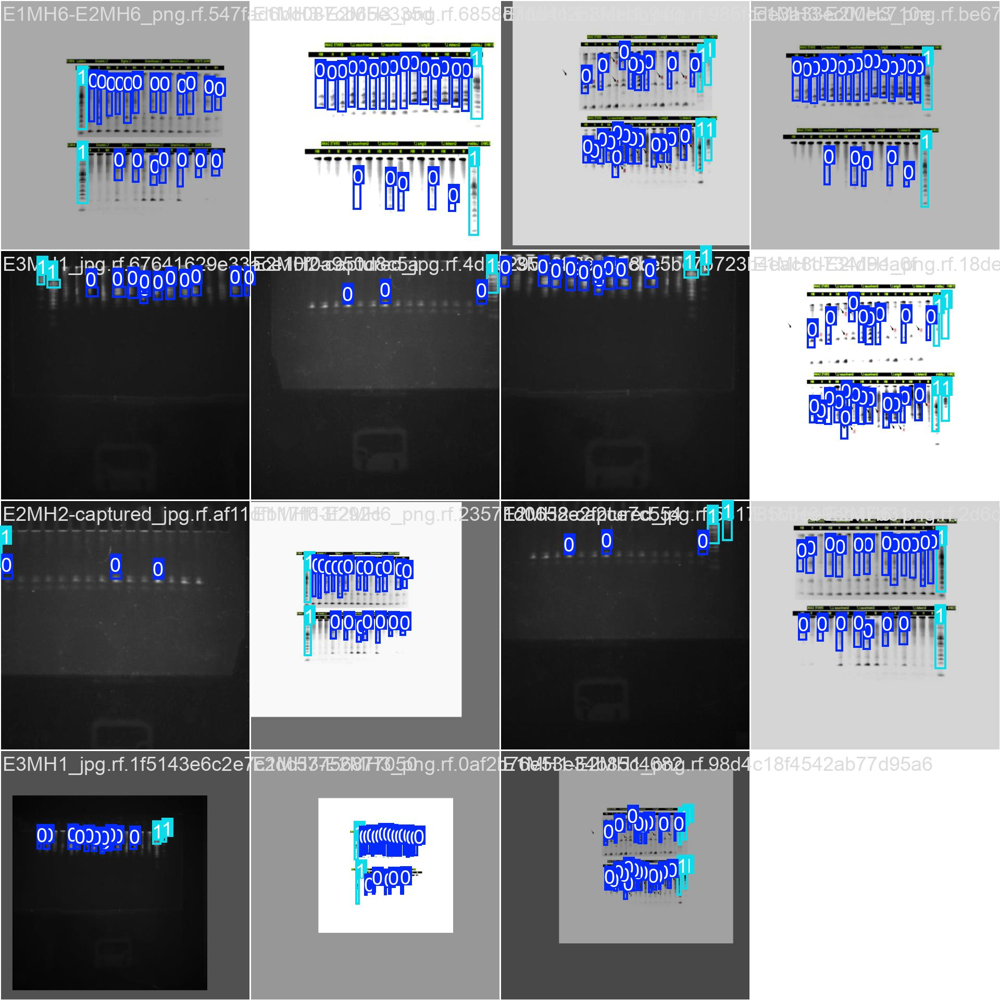

In [26]:
Image ("/content/runs/detect/train/train_batch52.jpg", width= 900)

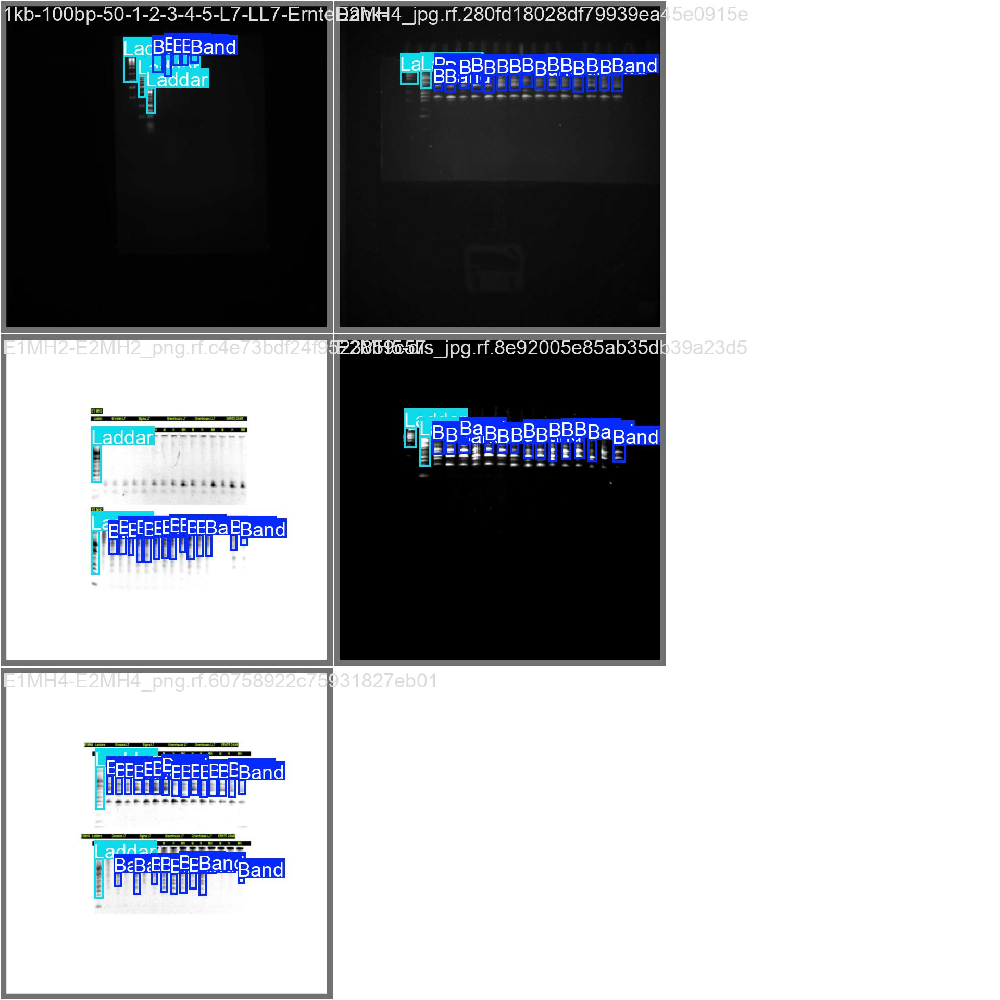

In [27]:
Image ("/content/runs/detect/train/val_batch0_labels.jpg", width= 900)

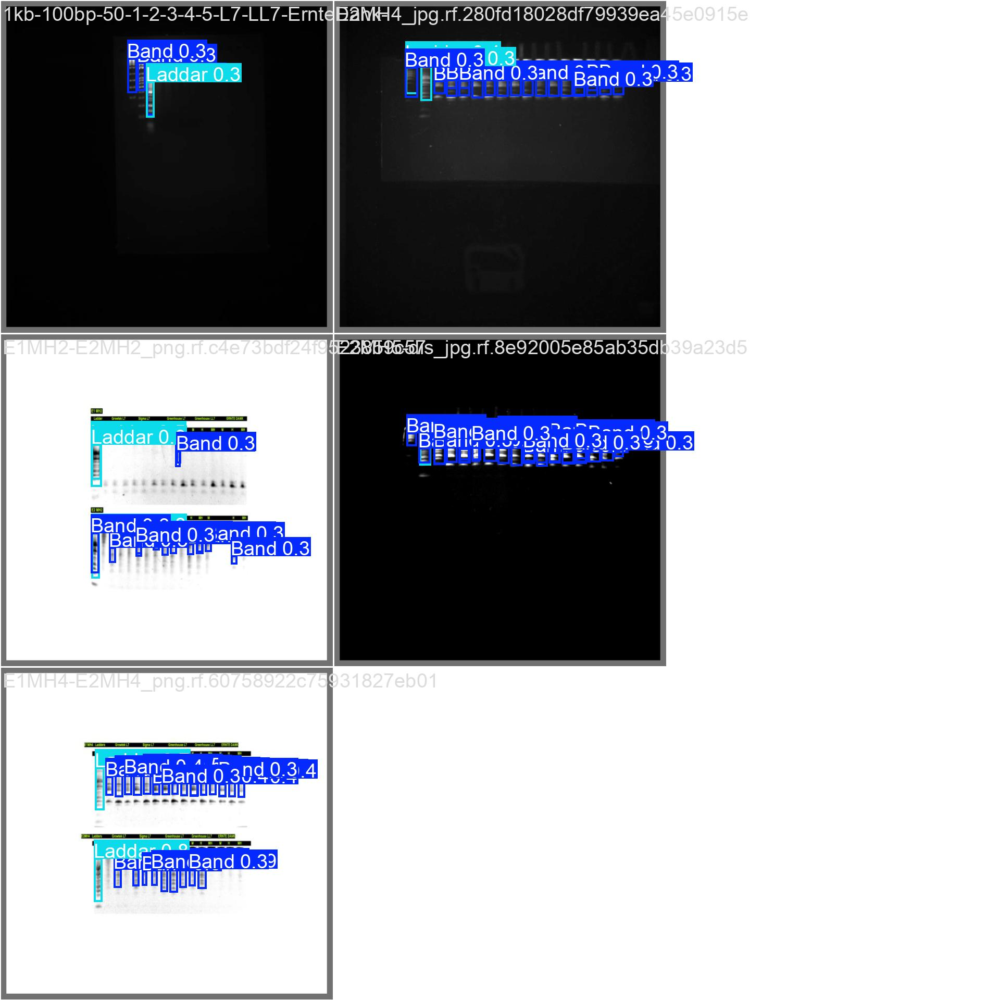

In [28]:
Image ("/content/runs/detect/train/val_batch0_pred.jpg", width= 900)

In [29]:
! yolo task=detect mode=val model="/content/runs/detect/train/weights/best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs
val: Scanning /content/Gel-annotation-on-lingonberry-1/valid/labels.cache... 5 images, 0 backgrounds, 0 corrupt: 100% 5/5 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:00<00:00,  1.69it/s]
                   all          5         85      0.524      0.587      0.513      0.235
                  Band          5         74      0.324      0.459       0.31     0.0984
                Laddar          5         11      0.724      0.715      0.717      0.371
Speed: 0.5ms preprocess, 28.7ms inference, 0.0ms loss, 60.8ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


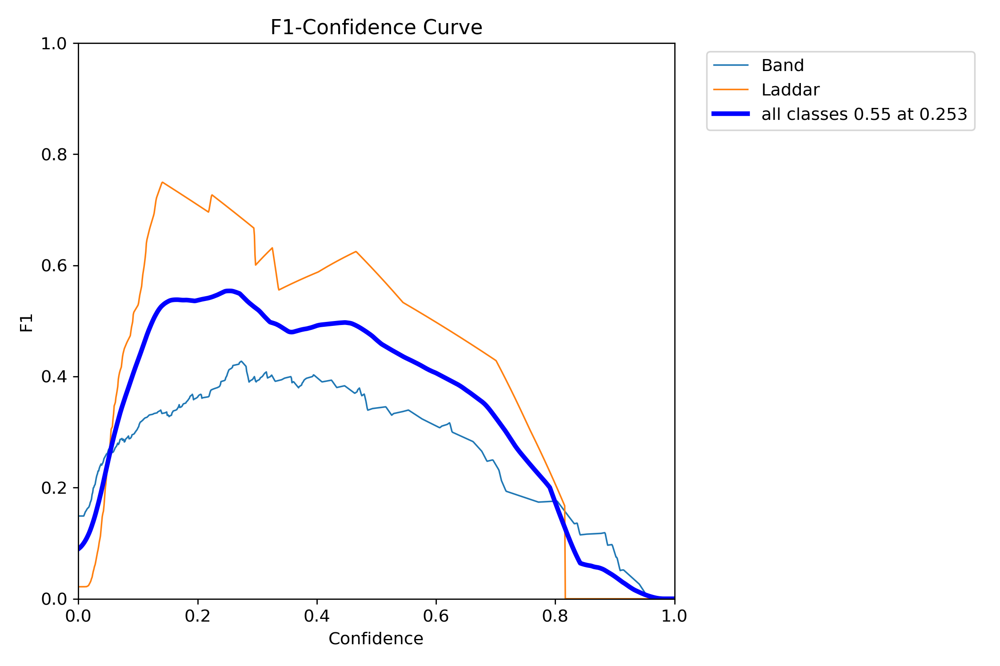

In [30]:
Image ("/content/runs/detect/val/F1_curve.png", width= 600)

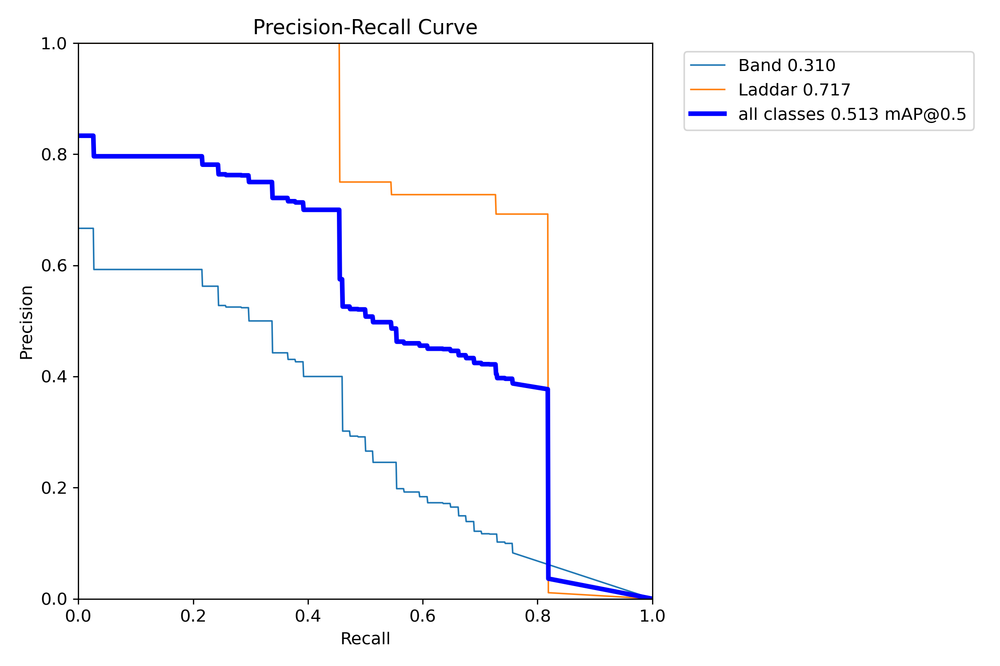

In [31]:
Image ("/content/runs/detect/val/PR_curve.png", width= 600)

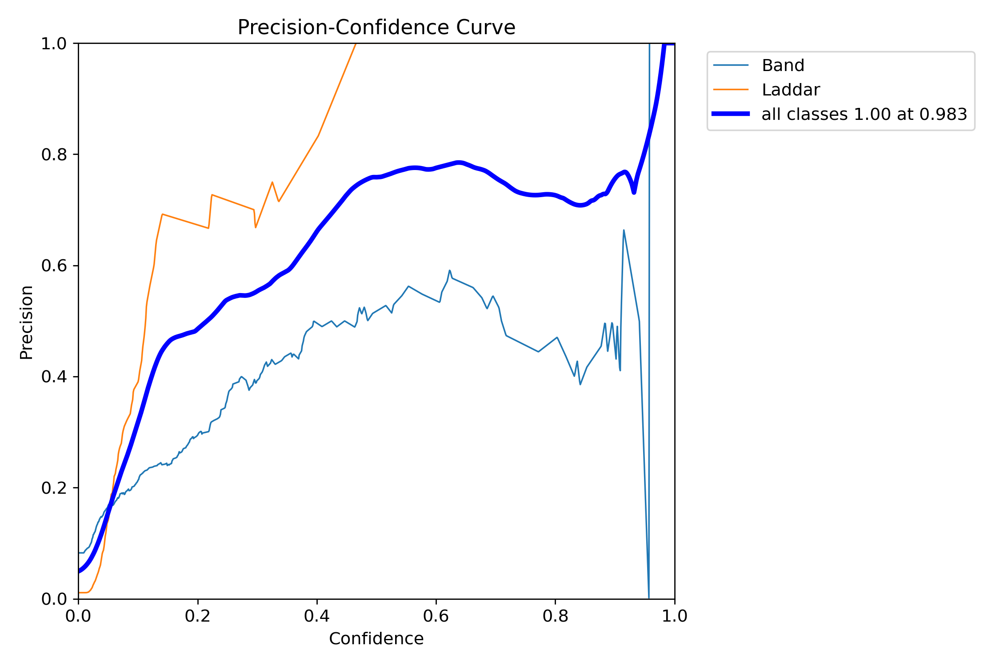

In [32]:
Image ("/content/runs/detect/val/P_curve.png", width= 600)

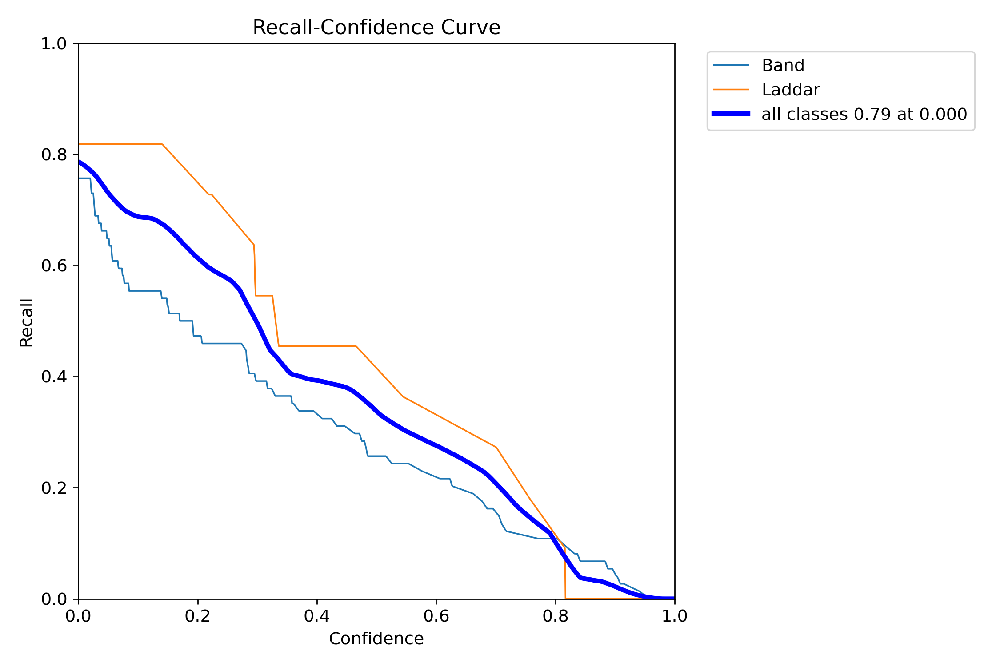

In [33]:
Image ("/content/runs/detect/val/R_curve.png", width= 600)

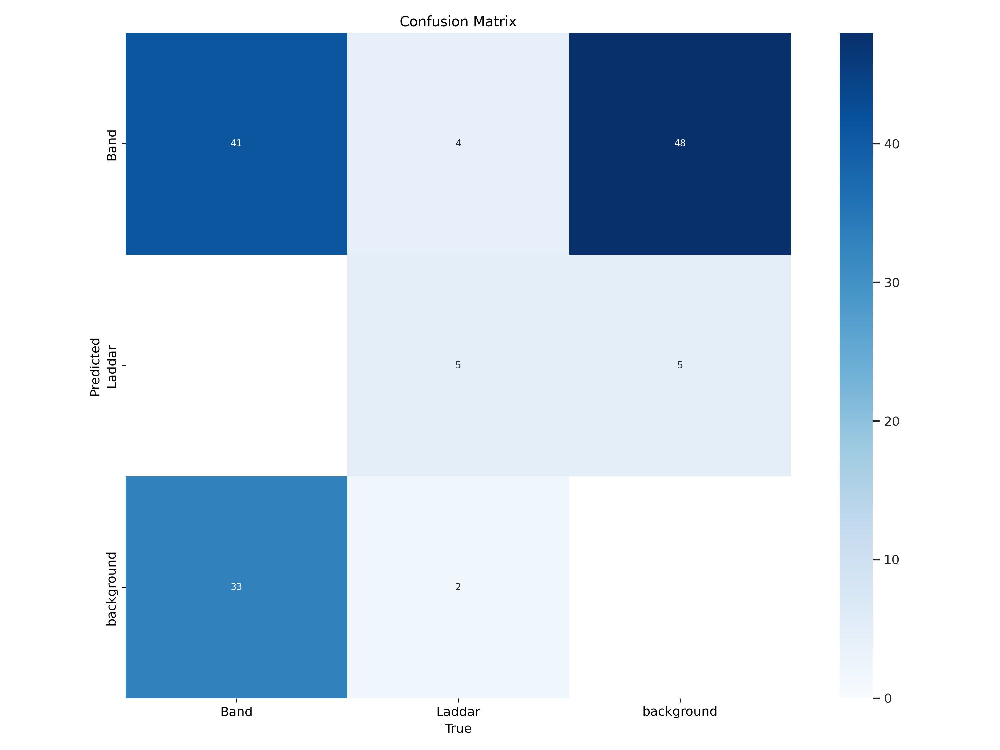

In [34]:
Image ("/content/runs/detect/val/confusion_matrix.png", width= 900)

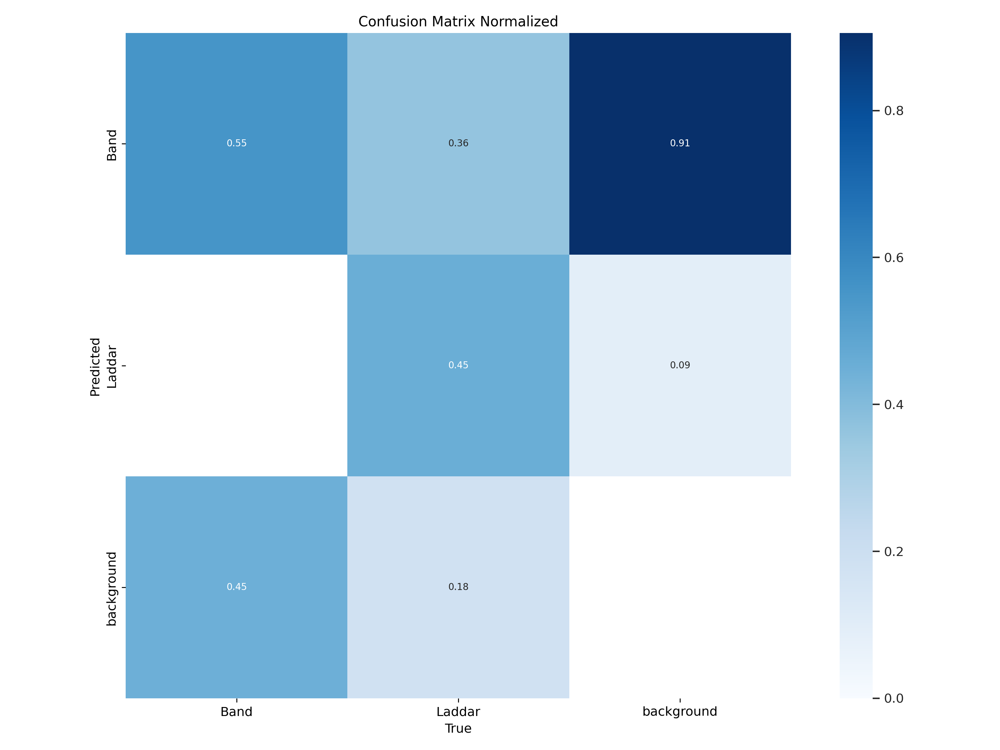

In [35]:
Image ("/content/runs/detect/val/confusion_matrix_normalized.png", width= 900)

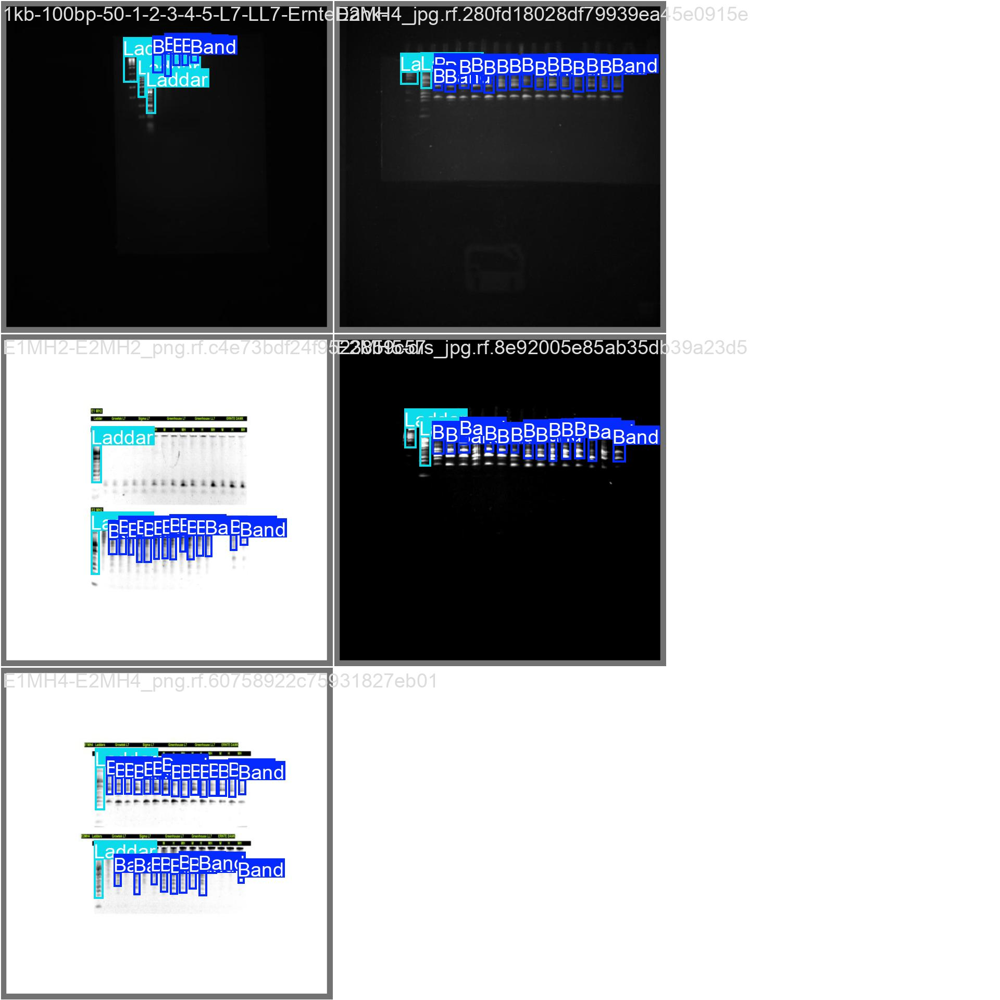

In [36]:
Image ("/content/runs/detect/val/val_batch0_labels.jpg", width= 900)

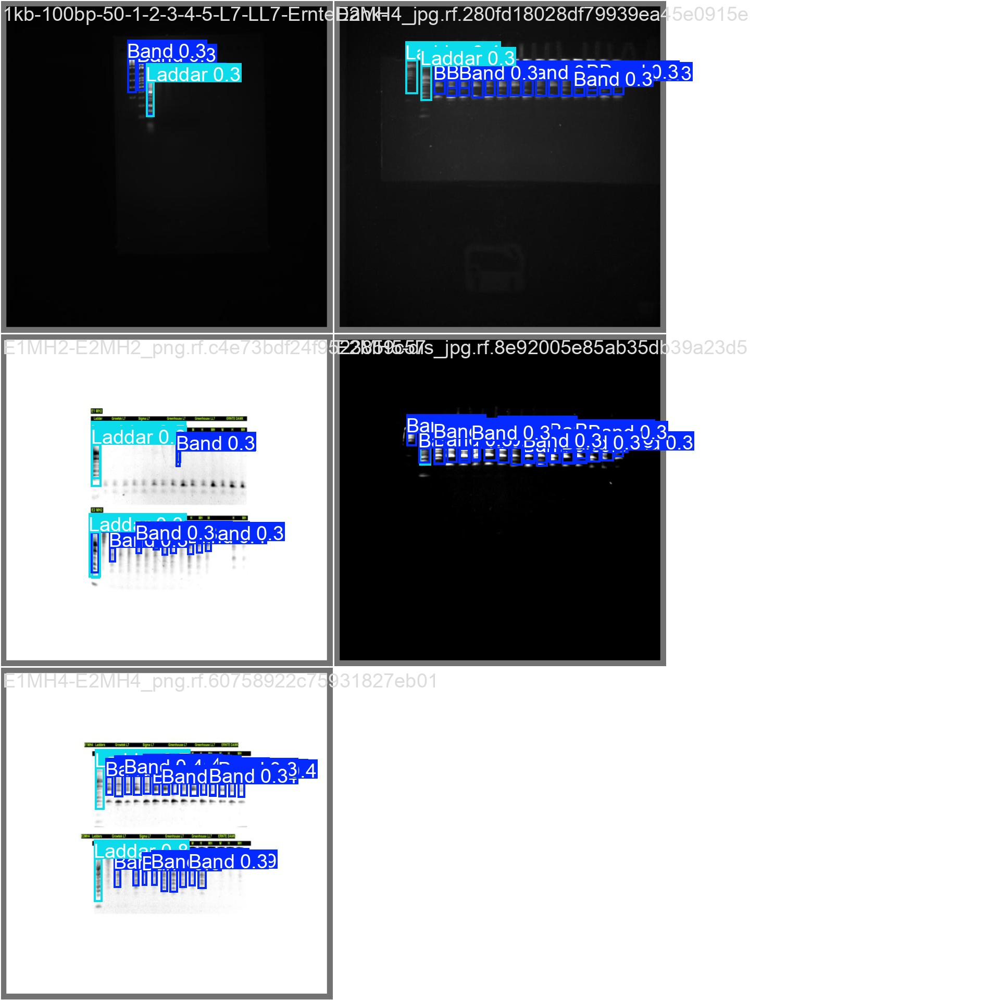

In [37]:
Image ("/content/runs/detect/val/val_batch0_pred.jpg", width= 900)

In [38]:
! yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs

image 1/4 /content/Gel-annotation-on-lingonberry-1/test/images/E1MH5-E2MH5_png.rf.7eabca9f7ab93b8a1a64a5e6cc9eab31.jpg: 800x800 25 Bands, 29.5ms
image 2/4 /content/Gel-annotation-on-lingonberry-1/test/images/E2MH1_jpg.rf.e232809d032546e0b0378a8899810a36.jpg: 800x800 7 Bands, 29.5ms
image 3/4 /content/Gel-annotation-on-lingonberry-1/test/images/E2MH3_jpg.rf.86ee065c6adbbeac3d5ad8863e4234a4.jpg: 800x800 7 Bands, 2 Laddars, 29.6ms
image 4/4 /content/Gel-annotation-on-lingonberry-1/test/images/E3MH6___jpg.rf.88e141aa1ed64a003ba22fd7dfa94ca6.jpg: 800x800 10 Bands, 29.5ms
Speed: 7.3ms preprocess, 29.5ms inference, 37.1ms postprocess per image at shape (1, 3, 800, 800)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


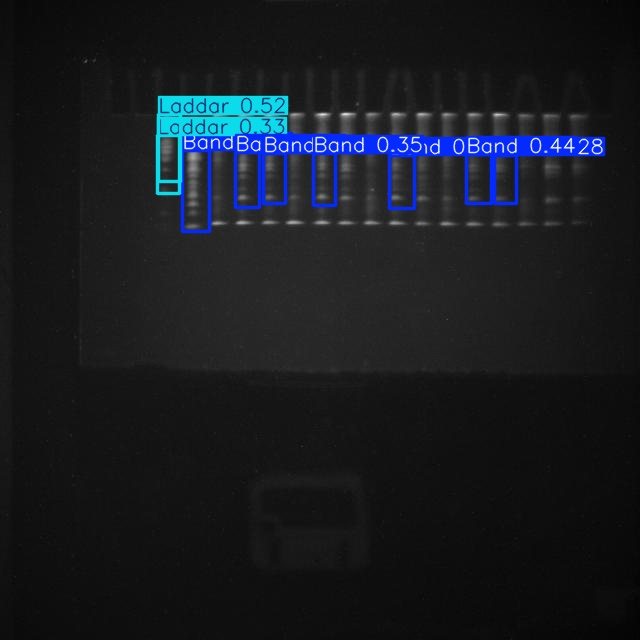

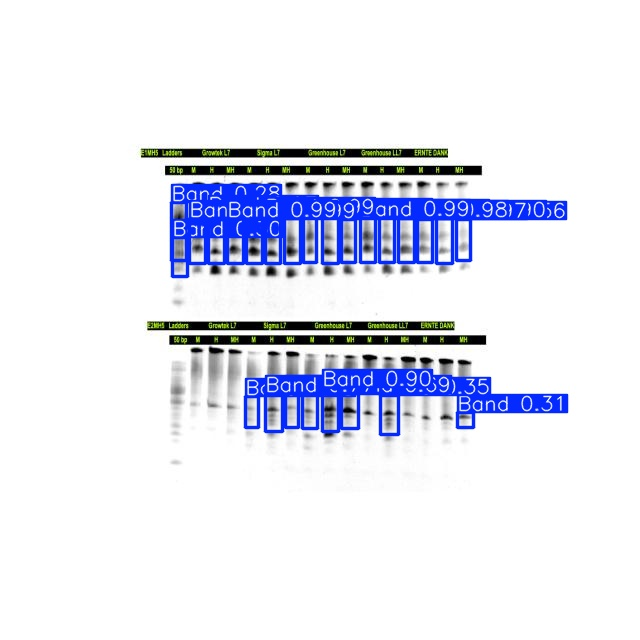

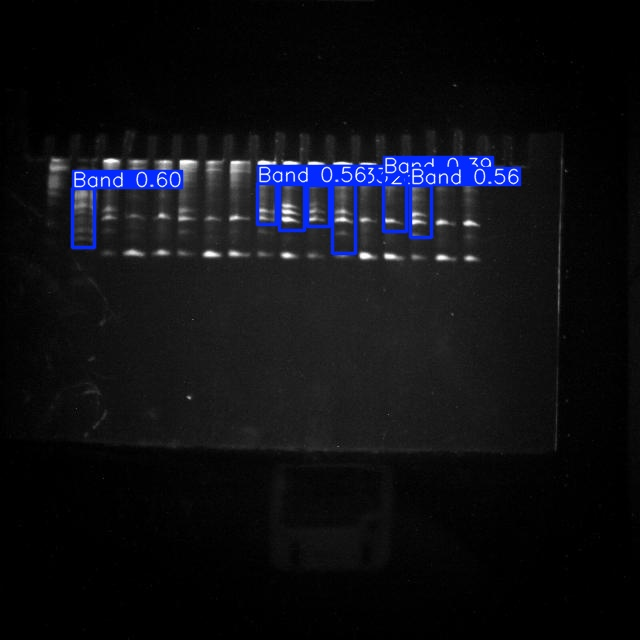

In [39]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
  display(IPyImage(filename=img, width=600))
  print("\n")

In [43]:
! yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/E1MH1-E2MH1.png save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 /content/drive/MyDrive/E1MH1-E2MH1.png: 544x800 34 Bands, 3 Laddars, 58.2ms
Speed: 3.9ms preprocess, 58.2ms inference, 191.4ms postprocess per image at shape (1, 3, 544, 800)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


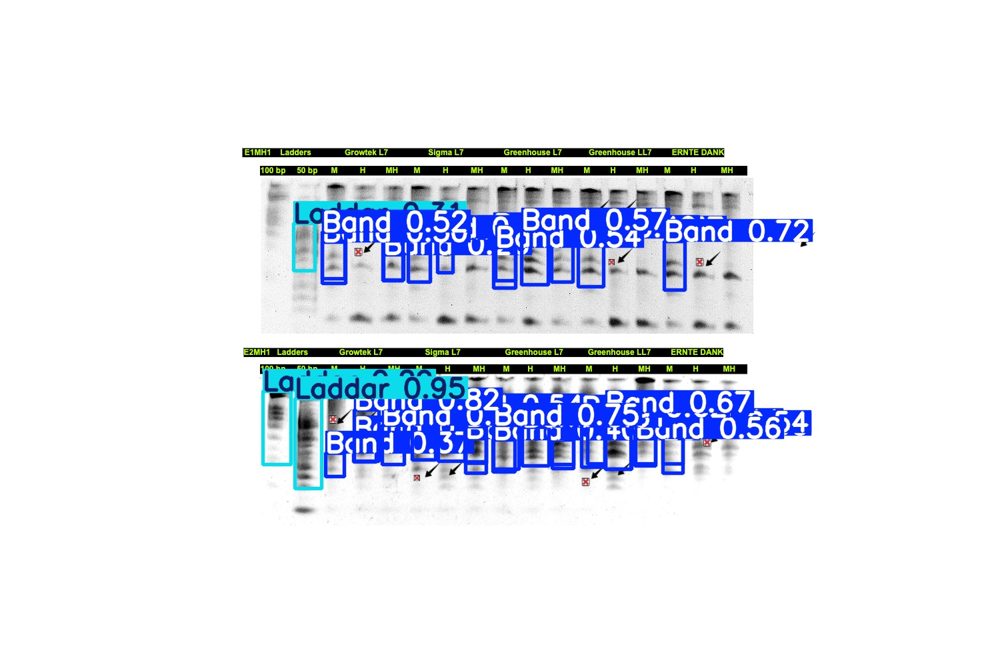

In [44]:
Image ("/content/runs/detect/predict3/E1MH1-E2MH1.jpg", width= 900)

In [45]:
! yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/E1MH2-E2MH2.png save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 /content/drive/MyDrive/E1MH2-E2MH2.png: 544x800 14 Bands, 3 Laddars, 56.2ms
Speed: 4.0ms preprocess, 56.2ms inference, 148.4ms postprocess per image at shape (1, 3, 544, 800)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


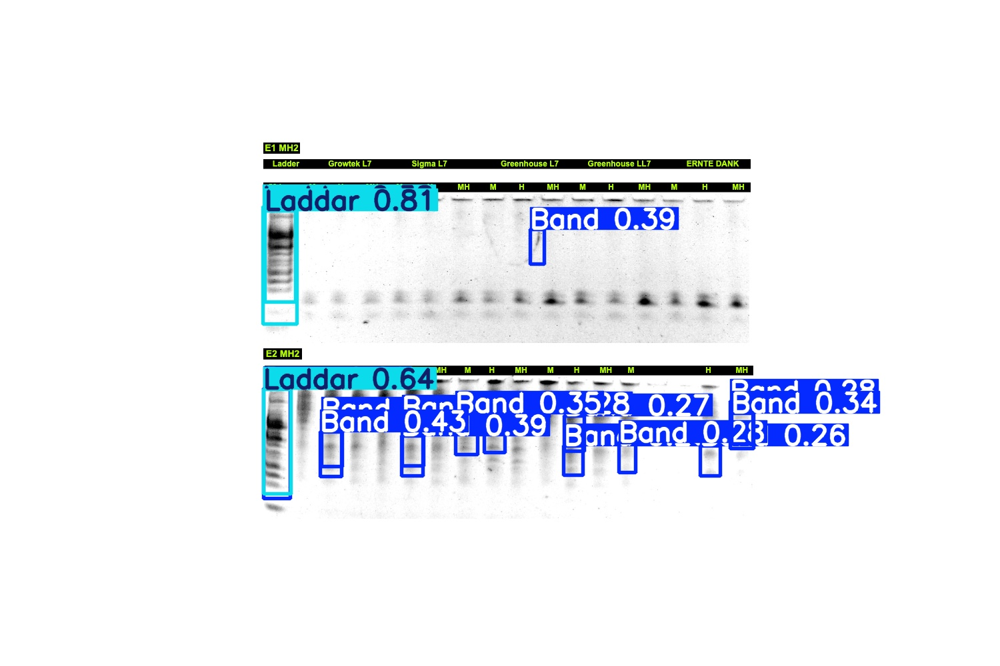

In [46]:
Image ("/content/runs/detect/predict4/E1MH2-E2MH2.jpg", width= 900)

In [47]:
! yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/E1MH3-E2MH3.png save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 /content/drive/MyDrive/E1MH3-E2MH3.png: 544x800 22 Bands, 2 Laddars, 65.3ms
Speed: 3.8ms preprocess, 65.3ms inference, 157.9ms postprocess per image at shape (1, 3, 544, 800)
Results saved to runs/detect/predict5
💡 Learn more at https://docs.ultralytics.com/modes/predict


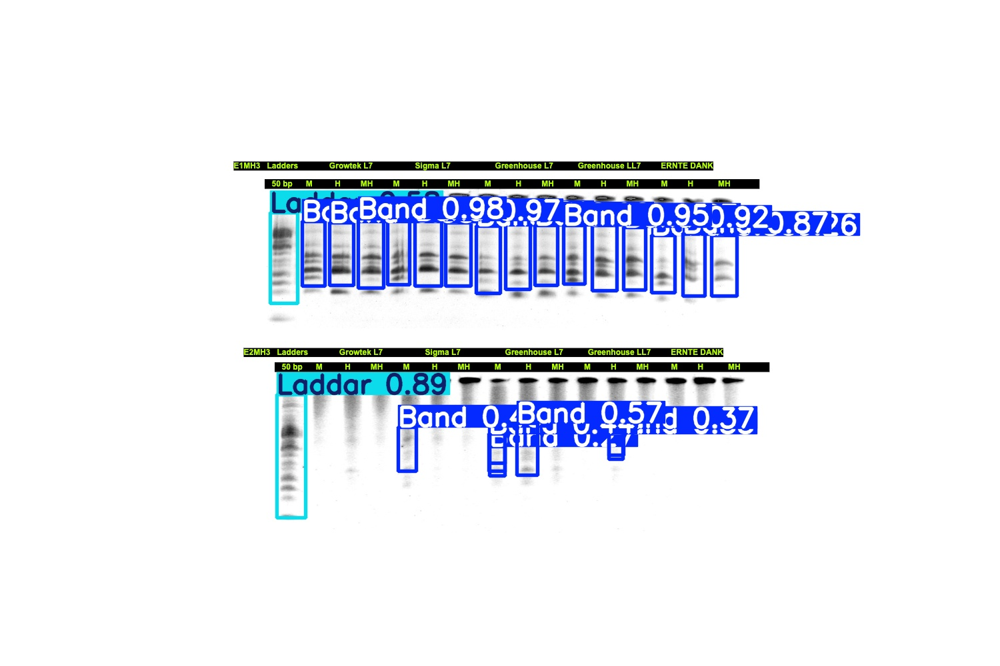

In [48]:
Image ("/content/runs/detect/predict5/E1MH3-E2MH3.jpg", width= 900)

In [49]:
! yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source=//content/drive/MyDrive/E1MH4-E2MH4.png save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 //content/drive/MyDrive/E1MH4-E2MH4.png: 544x800 22 Bands, 2 Laddars, 88.2ms
Speed: 6.2ms preprocess, 88.2ms inference, 196.2ms postprocess per image at shape (1, 3, 544, 800)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


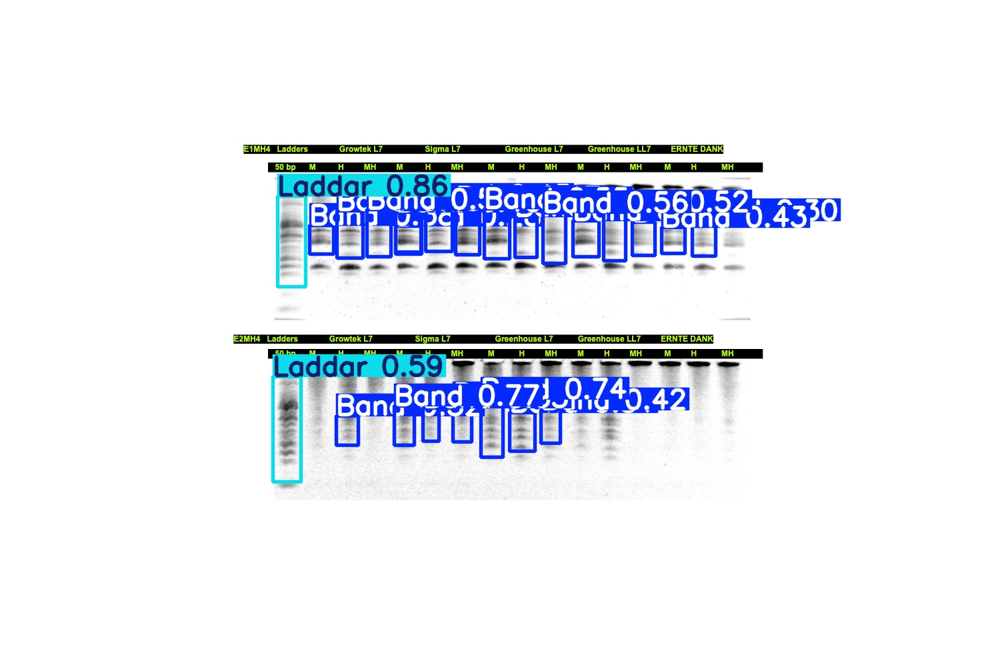

In [52]:
Image ("/content/runs/detect/predict6/E1MH4-E2MH4.jpg", width= 900)

In [53]:
! yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/E1MH5-E2MH5.png save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 /content/drive/MyDrive/E1MH5-E2MH5.png: 544x800 19 Bands, 60.4ms
Speed: 3.9ms preprocess, 60.4ms inference, 165.7ms postprocess per image at shape (1, 3, 544, 800)
Results saved to runs/detect/predict7
💡 Learn more at https://docs.ultralytics.com/modes/predict


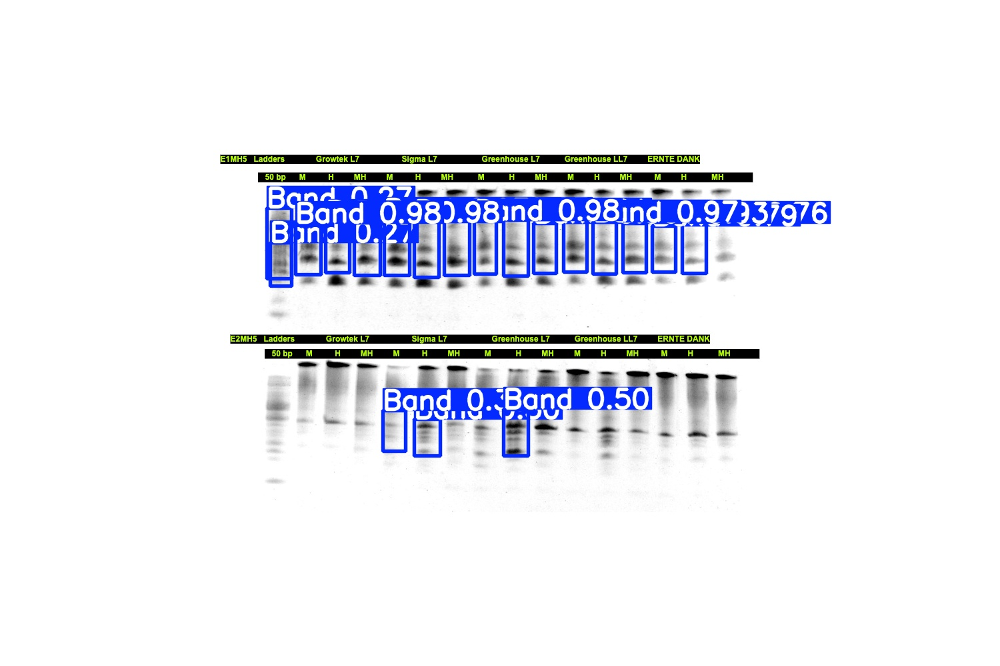

In [54]:
Image ("/content/runs/detect/predict7/E1MH5-E2MH5.jpg", width= 900)

In [55]:
! yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/E1MH6-E2MH6.png save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 /content/drive/MyDrive/E1MH6-E2MH6.png: 544x800 11 Bands, 2 Laddars, 56.8ms
Speed: 3.8ms preprocess, 56.8ms inference, 141.9ms postprocess per image at shape (1, 3, 544, 800)
Results saved to runs/detect/predict8
💡 Learn more at https://docs.ultralytics.com/modes/predict


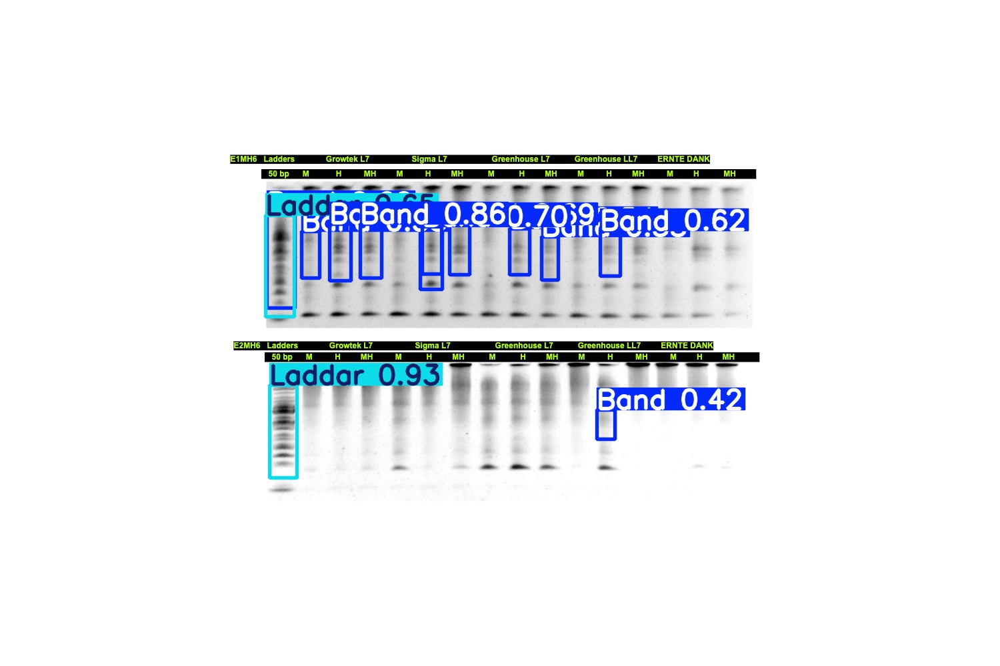

In [56]:
Image ("/content/runs/detect/predict8/E1MH6-E2MH6.jpg", width= 900)

In [61]:
! yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/E2MH4.jpg save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 /content/drive/MyDrive/E2MH4.jpg: 800x800 24 Bands, 2 Laddars, 29.5ms
Speed: 6.3ms preprocess, 29.5ms inference, 165.4ms postprocess per image at shape (1, 3, 800, 800)
Results saved to runs/detect/predict9
💡 Learn more at https://docs.ultralytics.com/modes/predict


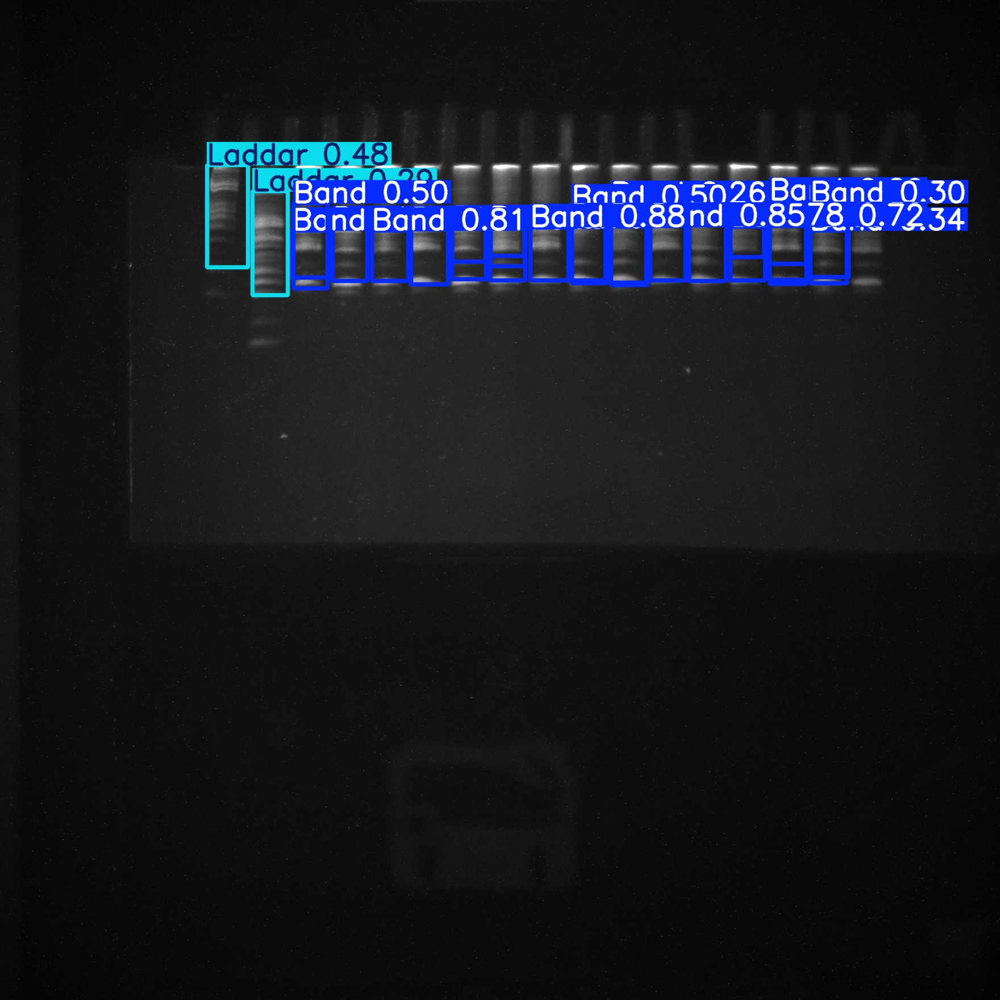

In [62]:
Image ("/content/runs/detect/predict9/E2MH4.jpg", width= 900)

In [63]:
! yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/InvertDNA.jpg save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 /content/drive/MyDrive/InvertDNA.jpg: 800x800 9 Bands, 3 Laddars, 29.5ms
Speed: 6.9ms preprocess, 29.5ms inference, 140.5ms postprocess per image at shape (1, 3, 800, 800)
Results saved to runs/detect/predict10
💡 Learn more at https://docs.ultralytics.com/modes/predict


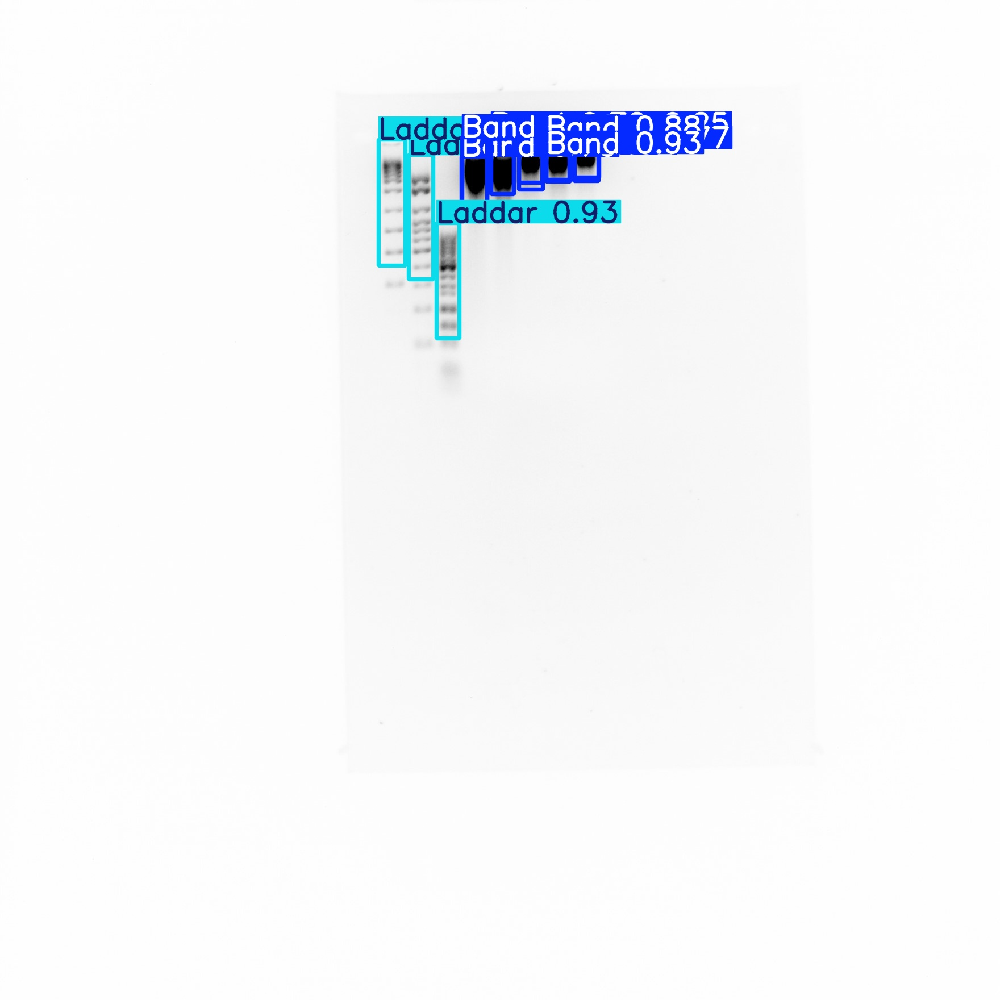

In [65]:
Image ("/content/runs/detect/predict10/InvertDNA.jpg", width= 900)

In [ ]:
# Thank you